OSMnx is a Python package to retrieve, model, analyze, and visualize street networks from OpenStreetMap. Users can download and model walkable, drivable, or bikeable urban networks with a single line of Python code, and then easily analyze and visualize them. 

Boeing, G. 2017. OSMnx: New Methods for Acquiring, Constructing, Analyzing, and Visualizing Complex Street Networks. Computers, Environment and Urban Systems 65, 126-139. doi:10.1016/j.compenvurbsys.2017.05.004

In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString
import osmnx as ox
import networkx as nx
import numpy as np
from matplotlib import *
from IPython.display import Image
import geopandas as gpd
import folium

### OSM street network

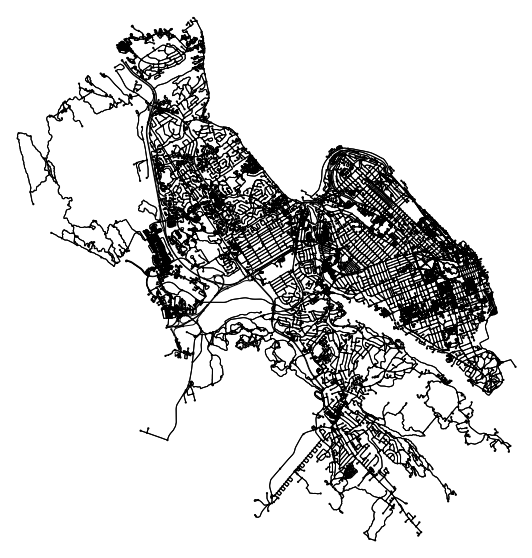

In [2]:
# Specify the name that is used to seach for the data
#place = "Helsinki, Finland"
#place = "Toronto, Canada"
place = "Halifax, Canada"

# Fetch OSM street network from the location
G = ox.graph_from_place(place, network_type="all")
# Plot the streets
fig, ax = ox.plot_graph(G,figsize=(10, 10), edge_color="black", node_color="black",bgcolor="white", node_size=5)

#### Convert graph to Nodes and Edges GeoDataFrames

In [3]:
# Convert graph to node and edge GeoPandas GeoDataFrames
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)
edges= ox.graph_to_gdfs(G, edges=True, nodes=False)
gdf_nodes.head(2) # nodes

,y,x,street_count,highway,ref,geometry
osmid,,,,,,
2710738,44.645750,-63.575540,4,NaN,NaN,POINT (-63.57554 44.64575)
15486210,44.638173,-63.577753,4,traffic_signals,NaN,POINT (-63.57775 44.63817)


In [4]:
gdf_edges.head(2) # edges

osmid  oneway           name       highway  \
u       v         key                                                   
2710738 32070340  0     45716008    True  Market Street  unclassified   
        582396482 0    148391544    True  Market Street  unclassified   

                      reversed   length  ref lanes maxspeed  \
u       v         key                                         
2710738 32070340  0      False  118.022  NaN   NaN      NaN   
        582396482 0      False  113.483  NaN   NaN      NaN   

                                                                geometry  \
u       v         key                                                      
2710738 32070340  0    LINESTRING (-63.57554 44.64575, -63.57605 44.6...   
        582396482 0    LINESTRING (-63.57554 44.64575, -63.57505 44.6...   

                      service junction access bridge width tunnel  
u       v         key                                              
2710738 32070340  0       NaN      NaN    NaN    NaN   NaN    NaN  
        582396482 0       NaN      NaN    NaN    NaN   NaN    NaN

### Calculate basic street network measures (topological and geometric)

#### Basic street network stats

In [5]:
# Network cover in square meters
G_proj = ox.project_graph(G)
nodes_proj = ox.graph_to_gdfs(G_proj, edges=False)
graph_area_m = nodes_proj.unary_union.convex_hull.area
graph_area_m

111261046.52587113

In [6]:
stats = ox.basic_stats(G, area=graph_area_m)
for k, count in stats["streets_per_node_counts"].items():
    stats["{}way_int_count".format(k)] = count
for k, proportion in stats["streets_per_node_proportions"].items():
    stats["{}way_int_prop".format(k)] = proportion

# delete the no longer needed dict elements
del stats["streets_per_node_counts"]
del stats["streets_per_node_proportions"]

# load as a pandas dataframe
pd.DataFrame(pd.Series(stats, name="value")).round(3)

,value
n,12140.000
m,31877.000
k_avg,5.252
edge_length_total,2128084.245
edge_length_avg,66.759
streets_per_node_avg,2.805
intersection_count,10028.000
street_length_total,1151930.436
street_segment_count,17017.000
street_length_avg,67.693


* circuity_avg - Calculate average street circuity using edges of undirected graph.Circuity is the sum of edge lengths divided by the sum of straight-line distances between edge endpoints. Calculates straight-line distance as euclidean distance if projected or great-circle distance if unprojected.
* clean_intersection_count - see clean_intersection_count function documentation
* clean_intersection_density_km - clean_intersection_count per sq km
* edge_density_km - edge_length_total per sq km
* edge_length_avg - edge_length_total / m
* edge_length_total -Graph’s total edge length.
* intersection_count - Count the intersections in a graph.
* intersection_density_km - intersection_count per sq km
* k_avg - graph’s average node degree (in-degree and out-degree)
* m - count of edges in graph
* n - count of nodes in graph
* node_density_km - n per sq km
* self_loop_proportion - see self_loop_proportion function documentation
* street_density_km - street_length_total per sq km
* street_length_avg - street_length_total / street_segment_count
* street_length_total -  graph’s total street segment length.
* street_segment_count - Count the street segments in a graph
* streets_per_node_avg - Calculate graph’s average count of streets per node.
* streets_per_node_counts - Calculate streets-per-node counts.
* streets_per_node_proportions - Calculate streets-per-node proportions.

stats documentation: https://osmnx.readthedocs.io/en/stable/osmnx.html#module-osmnx.stats

### Visualizing streets for various modes of transport

#### Drivable Roads in the city

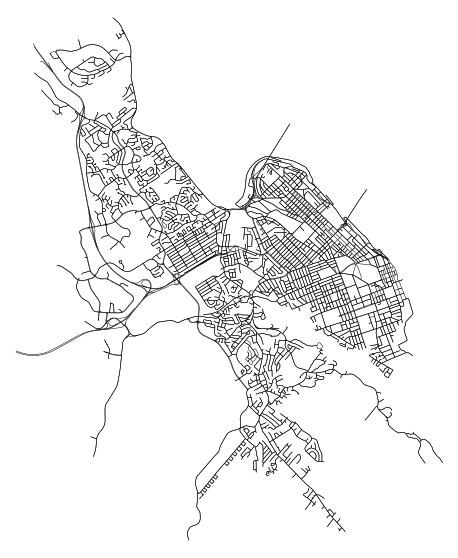

In [7]:
G = ox.graph_from_place(place, network_type="drive", truncate_by_edge=True)
fig, ax = ox.plot_graph(G, figsize=(10, 10), node_size=0, edge_color="black", edge_linewidth=0.5,bgcolor="white")

#### Walking in the city

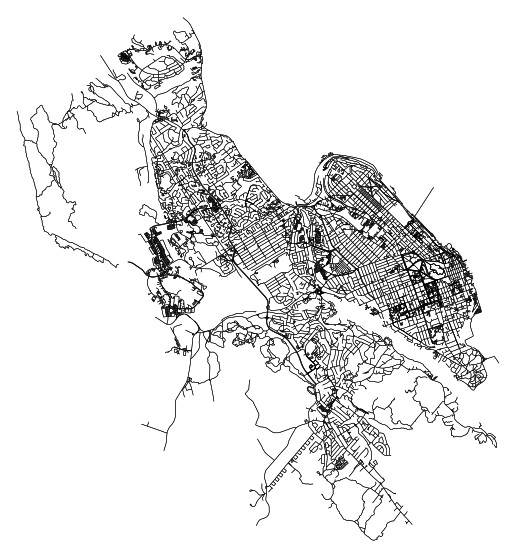

In [8]:
G = ox.graph_from_place(place, network_type="walk", truncate_by_edge=True)
fig, ax = ox.plot_graph(G, figsize=(10, 10), node_size=0, edge_color="black", edge_linewidth=0.5,bgcolor="white")

#### Cycling in the city

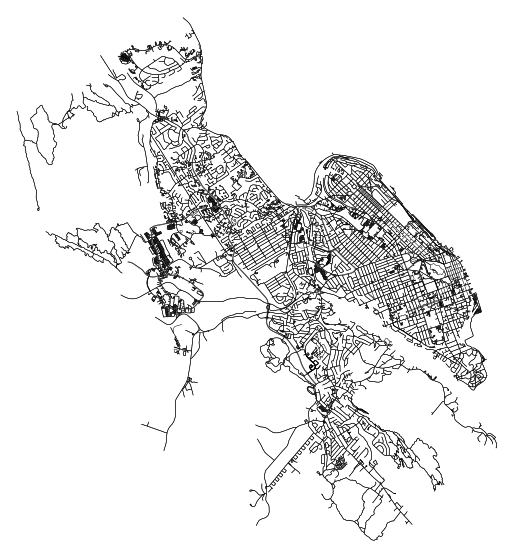

In [9]:
G = ox.graph_from_place(place, network_type="bike", truncate_by_edge=True)
fig, ax = ox.plot_graph(G, figsize=(10, 10), node_size=0, edge_color="black", edge_linewidth=0.5,bgcolor="white")

#### Comapring Driving vs. Walking vs. Cycling Paths

In [10]:
drv_grph = ox.graph_from_place(place, network_type="drive")
# calculate basic and extended network stats, merge them together, and display
G_proj = ox.project_graph(drv_grph)
nodes_proj = ox.graph_to_gdfs(G_proj, edges=False)
graph_area_m = nodes_proj.unary_union.convex_hull.area
stats = ox.basic_stats(drv_grph, area=graph_area_m)
drive_street_len = stats["street_density_km"]

In [11]:
bike_grph = ox.graph_from_place(place, network_type="bike")
# calculate basic and extended network stats, merge them together, and display
G_proj = ox.project_graph(bike_grph)
nodes_proj = ox.graph_to_gdfs(G_proj, edges=False)
graph_area_m = nodes_proj.unary_union.convex_hull.area
stats = ox.basic_stats(bike_grph, area=graph_area_m)
bike_street_len = stats["street_density_km"]

In [12]:
walk_grph = ox.graph_from_place(place, network_type="walk")
# calculate basic and extended network stats, merge them together, and display
# What sized area does our network cover in square meters
G_proj = ox.project_graph(walk_grph)
nodes_proj = ox.graph_to_gdfs(G_proj, edges=False)
graph_area_m = nodes_proj.unary_union.convex_hull.area
stats = ox.basic_stats(bike_grph, area=graph_area_m)
walkable_street_len = stats["street_density_km"]

 #### Comparing Street density (street_length_total per sq km)

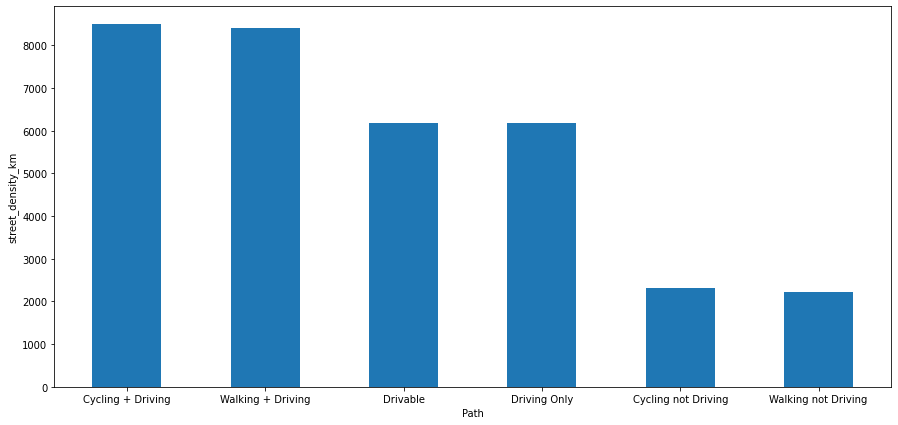

In [13]:
bike_only_len = bike_street_len - drive_street_len
walk_only_len = walkable_street_len - drive_street_len
drive_only_len = walkable_street_len - (walk_only_len )

# creating the dataset
data = {'Cycling + Driving':bike_street_len, 
        'Walking + Driving':walkable_street_len,
        'Drivable':drive_street_len, 
        'Driving Only': drive_only_len, 
        'Cycling not Driving': bike_only_len,
       'Walking not Driving': walk_only_len,
       }
courses = list(data.keys())
values = list(data.values())
  
fig = plt.figure(figsize = (15, 7))
 
# creating the bar plot
plt.bar(courses, values,
        width = 0.5)
 
plt.xlabel("Path")
plt.ylabel("street_density_km")
plt.show()

Street density for Cycling and Walking paths are quite high than Driving paths. Also, paths that are accessible by Walking or Cycling and not be driving are also visualized

### Plotting Map Features

More details about the Map Features - https://wiki.openstreetmap.org/wiki/Map_features

#### Hospitals

C:\Users\geeth\AppData\Local\Temp/ipykernel_36204/3977296050.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = hospital.centroid


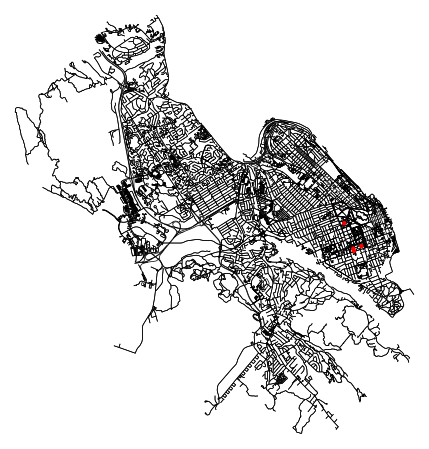

(<Figure size 576x576 with 1 Axes>, <AxesSubplot: >)

In [14]:
# List key-value pairs for tags such as hospital
tags = {'amenity': 'hospital'}
# Retrieve hospital
hospital = ox.geometries_from_place(place, tags)
# getting centroids from hospital to avoid polygon geometric objects
hospital['geometry'] = [geom.centroid for geom in hospital['geometry']]
# reset index
hospital = hospital.reset_index(drop=True)
centroids = hospital.centroid
lons = list(centroids.x)
lats = list(centroids.y)
name = list(hospital.name)
building_coords = [[lats[i],lons[i],name[i]] for i in range(len(lons))]

dictionary = dict()

for i in range(len(building_coords)):
     node_id = i+1
     dictionary[node_id] = {
    'x': lons[i],
    'y': lats[i],
    'name':name[i]
     }

tmp_list = []
for item_key, item_value in dictionary.items() :
  tmp_list.append({
    'geometry' : Point(item_value['x'], item_value['y']),
    'osmid': item_key,
    'y' : item_value['y'],
    'x' : item_value['x'],
    'name':item_value['name']
   })
my_nodes = gpd.GeoDataFrame(tmp_list)

# Plot the building nodes
hospital_nodes = my_nodes


graph2 = ox.graph_from_gdfs(hospital_nodes,edges)
ox.plot_graph(graph2, node_size=20, edge_color="black", node_color="red", edge_linewidth=0.7, bgcolor="white")

#### Bus Stations

C:\Users\geeth\AppData\Local\Temp/ipykernel_36204/769164314.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = bus_stop.centroid


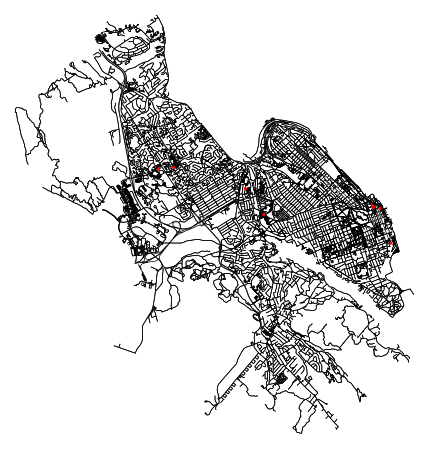

(<Figure size 576x576 with 1 Axes>, <AxesSubplot: >)

In [15]:
# List key-value pairs for tags such as restaurants
tags = {'amenity' : 'bus_station'}
# Retrieve restaurants
bus_stop = ox.geometries_from_place(place, tags)
# getting centroids from restaurants to avoid polygon geometric objects
bus_stop['geometry'] = [geom.centroid for geom in bus_stop['geometry']]
# reset index
bus_stop = bus_stop.reset_index(drop=True)
centroids = bus_stop.centroid
lons = list(centroids.x)
lats = list(centroids.y)
name = list(bus_stop.name)
building_coords = [[lats[i],lons[i],name[i]] for i in range(len(lons))]

dictionary = dict()

for i in range(len(building_coords)):
     node_id = i+1
     dictionary[node_id] = {
    'x': lons[i],
    'y': lats[i],
    'name':name[i]
     }

tmp_list = []
for item_key, item_value in dictionary.items() :
  tmp_list.append({
    'geometry' : Point(item_value['x'], item_value['y']),
    'osmid': item_key,
    'y' : item_value['y'],
    'x' : item_value['x'],
    'name':item_value['name']
   })
my_nodes = gpd.GeoDataFrame(tmp_list)

#Plot the building nodes
bus_nodes = my_nodes


graph3 = ox.graph_from_gdfs(bus_nodes,edges)
ox.plot_graph(graph3, node_size=10, edge_color="black", node_color="red", edge_linewidth=0.7, bgcolor="white")

#### Parking Spots

C:\Users\geeth\AppData\Local\Temp/ipykernel_36204/258025325.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = parking.centroid


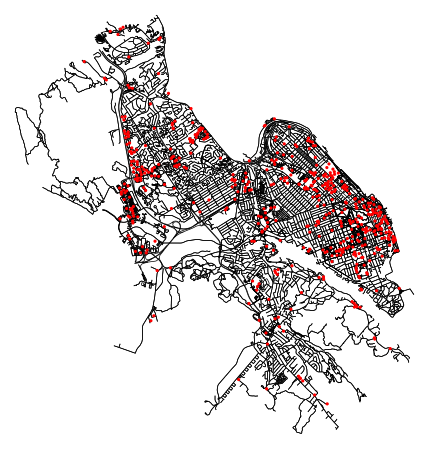

(<Figure size 576x576 with 1 Axes>, <AxesSubplot: >)

In [16]:
# List key-value pairs for tags such as restaurants
tags = {'amenity' : 'parking'}
# Retrieve restaurants
parking = ox.geometries_from_place(place, tags)
# getting centroids from restaurants to avoid polygon geometric objects
parking['geometry'] = [geom.centroid for geom in parking['geometry']]
# reset index
parking = parking.reset_index(drop=True)
centroids = parking.centroid
lons = list(centroids.x)
lats = list(centroids.y)
name = list(parking.name)
building_coords = [[lats[i],lons[i],name[i]] for i in range(len(lons))]

dictionary = dict()

for i in range(len(building_coords)):
     node_id = i+1
     dictionary[node_id] = {
    'x': lons[i],
    'y': lats[i],
    'name':name[i]
     }

tmp_list = []
for item_key, item_value in dictionary.items() :
  tmp_list.append({
    'geometry' : Point(item_value['x'], item_value['y']),
    'osmid': item_key,
    'y' : item_value['y'],
    'x' : item_value['x'],
    'name':item_value['name']
   })
my_nodes = gpd.GeoDataFrame(tmp_list)

# Plot the building nodes
park_nodes = my_nodes


graph3 = ox.graph_from_gdfs(park_nodes,edges)
ox.plot_graph(graph3, node_size=10, edge_color="black", node_color="red", edge_linewidth=0.7, bgcolor="white")

#### Charging Stations

C:\Users\geeth\AppData\Local\Temp/ipykernel_36204/3807949860.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = charging_station.centroid


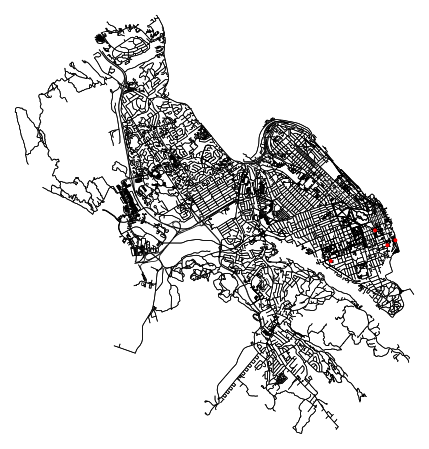

(<Figure size 576x576 with 1 Axes>, <AxesSubplot: >)

In [17]:
# List key-value pairs for tags such as restaurants
tags = {'amenity' : 'charging_station'}
# Retrieve restaurants
charging_station = ox.geometries_from_place(place, tags)
# getting centroids from restaurants to avoid polygon geometric objects
charging_station['geometry'] = [geom.centroid for geom in charging_station['geometry']]
# reset index
charging_station = charging_station.reset_index(drop=True)
centroids = charging_station.centroid
lons = list(centroids.x)
lats = list(centroids.y)
name = list(charging_station.name)
building_coords = [[lats[i],lons[i],name[i]] for i in range(len(lons))]
dictionary = dict()

for i in range(len(building_coords)):
     node_id = i+1
     dictionary[node_id] = {
    'x': lons[i],
    'y': lats[i],
    'name':name[i]
     }

tmp_list = []
for item_key, item_value in dictionary.items() :
  tmp_list.append({
    'geometry' : Point(item_value['x'], item_value['y']),
    'osmid': item_key,
    'y' : item_value['y'],
    'x' : item_value['x'],
    'name':item_value['name']
   })
my_nodes = gpd.GeoDataFrame(tmp_list)

# Plot the building nodes
charging_nodes = my_nodes

graph3 = ox.graph_from_gdfs(charging_nodes,edges)
ox.plot_graph(graph3, node_size=15, edge_color="black", node_color="red", edge_linewidth=0.7, bgcolor="white")

### Visualize street centrality

### Closeness centrality

Closeness centrality is usually interpreted either as a measure of access efficiency or of independence from potential control by intermediaries. Betweenness centrality is generally regarded as a measure of others' dependence on a given node, and therefore as a measure of potential control. Closeness centrality is usually interpreted either as a measure of access efficiency or of independence from potential control by intermediaries.

Here we plot the street network and color its edges (streets) by their relative closeness centrality.

In [18]:
#A = nx.adjacency_matrix(G).tolil()
#D = scipy.sparse.csgraph.floyd_warshall( \
#             A, directed=False, unweighted=False)

# Use the shortest path Matrix to calculate the closeness metric for each node
#n = D.shape[0]
#closeness_centrality = {}
#for r in range(0, n):
    
#    cc = 0.0
    
#    possible_paths = list(enumerate(D[r, :]))
#    shortest_paths = dict(filter( \
#        lambda x: not x[1] == np.inf, possible_paths))
    
#    total = sum(shortest_paths.values())
#    n_shortest_paths = len(shortest_paths) - 1.0
#    if total > 0.0 and n > 1:
#        s = n_shortest_paths / (n - 1)
#        cc = (n_shortest_paths / total) * s
#    closeness_centrality[r] = cc

In [19]:
# convert graph to line graph so edges become nodes and vice versa
#edge_centrality = nx.closeness_centrality(nx.line_graph(G))
#nx.set_edge_attributes(G, edge_centrality, "edge_centrality")

In [20]:
#color edges in original graph with closeness centralities from line graph
#ec = ox.plot.get_edge_colors_by_attr(G, "edge_centrality", cmap="inferno")
#fig, ax = ox.plot_graph(G, edge_color=ec, edge_linewidth=2, node_size=0)

### Inspect betweenness centrality

Betweenness centrality is a way of detecting the amount of influence a node has over the flow of information in a graph. It is often used to find nodes that serve as a bridge from one part of a graph to another.


Betweenness centrality is an indicator of a node's centrality in a network. It is equal to the number of shortest paths from all vertices to all others that pass through that node. A node with high betweenness centrality has a large influence on the transfer of items through the network, under the assumption that item transfer follows the shortest paths. 

Definition:  num. shortest paths through node / all possible shortest paths 

This metric captures a different view of importance - in essence, it captures bottleneck nodes in a graph, rather that highly connected nodes; If we removed these crucial nodes in the network, then traffic will not flow (or at least not as easily) between subnetworks.

In [21]:
gdf = ox.geocode_to_gdf(place)
area = ox.project_gdf(gdf).unary_union.area
G = ox.graph_from_place(place, network_type="drive")
# calculate betweenness with a digraph of G (ie, no parallel edges). Considering k =1000 due to huge computation time
bc = nx.betweenness_centrality(ox.get_digraph(G), weight="length", k=1000)
max_node, max_bc = max(bc.items(), key=lambda x: x[1])
max_node, max_bc

(30695564, 0.23148969490328028)

In the city network, the node with the highest betweenness centrality has ~22% of all shortest paths running through it. It is highlight it in the plot:

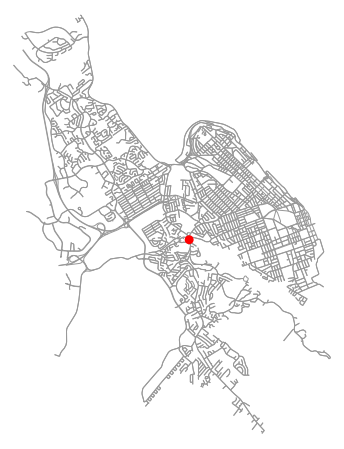

In [22]:
nc = ["r" if node == max_node else "w" for node in G.nodes]
ns = [80 if node == max_node else 0 for node in G.nodes]

for node in G.nodes:
    if node == max_node:
        nl = G.nodes[max_node]['x']
        ny = G.nodes[max_node]['y']
    

fig, ax = ox.plot_graph(G, node_size=ns, node_color=nc, node_zorder=2, bgcolor="white")

##### ~22% of all shortest paths run through the node highlighted in red.

The relative betweenness centrality of every node in the graph is visualized below

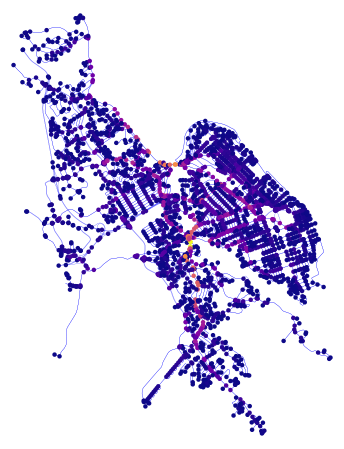

In [23]:
# add the betweenness centraliy values as new node attributes, then plot
nx.set_node_attributes(G, bc, "bc")
nc = ox.plot.get_node_colors_by_attr(G, "bc", cmap="plasma")
fig, ax = ox.plot_graph(
    G,
    node_color=nc,
    node_size=20,
    node_zorder=3,
    edge_linewidth=0.2,
    edge_color="b",
    bgcolor="white"
)

Above, the nodes are visualized by betweenness centrality, from low (dark violet) to high (light yellow). 

## Visualizations using Folium Map

In [24]:
# Plot the street network with folium
m = ox.plot_graph_folium(G, popup_attribute="name", weight=2, color="#808080")

In [25]:
# Betweenness Centrality
location = [ny, nl]
icon=folium.Icon(icon="fa", prefix='fa',color='red')
folium.Marker(location=location, icon=icon, tooltip = "Node with maximum centrality").add_to(m)

In [26]:
#Hospital
for i in range(hospital_nodes.shape[0]):
  location = [hospital_nodes.y.iloc[i], hospital_nodes.x.iloc[i],]
  loc_name = hospital_nodes.name.iloc[i]
  icon=folium.Icon(icon="fa-hospital-o", prefix='fa')
  folium.Marker(location=location, tooltip=loc_name, icon=icon).add_to(m)

#Bus Station    
for i in range(bus_nodes.shape[0]):
  location = [bus_nodes.y.iloc[i], bus_nodes.x.iloc[i],]
  loc_name = bus_nodes.name.iloc[i]
  icon=folium.Icon(icon="fa-bus", prefix='fa', color = "cadetblue")
  folium.Marker(location=location, tooltip="Bus station", icon=icon).add_to(m)

#Parking Space       
for i in range(park_nodes.shape[0]):
  location = [park_nodes.y.iloc[i], park_nodes.x.iloc[i],]
  loc_name = park_nodes.name.iloc[i]
  icon=folium.Icon(icon="fa-map-marker", prefix='fa', color = 'green')
  folium.CircleMarker(location=location, tooltip="Parking Space", radius=float(3),
      color='green',
      fill=True,
      fill_color='green').add_to(m)
    

#Charging Station
for i in range(charging_nodes.shape[0]):
  location = [charging_nodes.y.iloc[i], charging_nodes.x.iloc[i],]
  loc_name = charging_nodes.name.iloc[i]
  icon=folium.Icon(icon="fa-plug", prefix='fa', color = "orange")
  folium.Marker(location=location, tooltip="Charging Station", icon=icon).add_to(m)
    
display(m)


In [27]:
# save as html file
filepath = "map_visualisation_Halifax.html"
m.save(filepath)